In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import os
import numpy as np
from PIL import Image
import cv2

# Define the paths for SAR and optical images from the "urban" section
image_path_sar = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/urban/s2'
image_path_sar1 = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/agri/s2'
image_path_sar2 = '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/grassland/s2'
image_path_sar3= '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/barrenland/s2'

import os
import shutil

# Define the paths for SAR images from different classes
paths = {
    "urban": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/urban/s2',
    "agri": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/agri/s2',
    "grassland": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/grassland/s2',
    "barrenland": '/kaggle/input/sentinel12-image-pairs-segregated-by-terrain/v_2/barrenland/s2'
}

# Create a new folder to store the combined dataset
combined_dataset_path = '/kaggle/working/SAR_Segment'
if not os.path.exists(combined_dataset_path):
    os.makedirs(combined_dataset_path)

# Create subdirectories for each class
for label in paths.keys():
    class_path = os.path.join(combined_dataset_path, label)
    if not os.path.exists(class_path):
        os.makedirs(class_path)

# Copy the images to the respective folders in the combined dataset
for label, image_path in paths.items():
    for image_name in os.listdir(image_path):
        src = os.path.join(image_path, image_name)
        dst = os.path.join(combined_dataset_path, label, image_name)
        shutil.copy(src, dst)

print("Dataset successfully combined into SAR_Segment with 4 classes.")




Dataset successfully combined into SAR_Segment with 4 classes.


In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
IMG_SIZE = (224, 224)  # You can adjust this size based on your needs
BATCH_SIZE = 32

# Set the path to the combined dataset
dataset_path = '/kaggle/working/SAR_Segment'

# Use ImageDataGenerator to load images from directories
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # Rescale the pixel values between 0 and 1

# Create training and validation datasets
train_data = datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Since we have multiple classes
    subset='training'  # Use the training data split
)

val_data = datagen.flow_from_directory(
    dataset_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Since we have multiple classes
    subset='validation'  # Use the validation data split
)

# Print class indices
print(train_data.class_indices)  # This will print the mapping of class names to indices


E0000 00:00:1730549279.183385      13 common_lib.cc:798] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: ===
learning/45eac/tfrc/runtime/common_lib.cc:479
D1102 12:07:59.191383617      13 config.cc:196]                        gRPC EXPERIMENT call_status_override_on_cancellation   OFF (default:OFF)
D1102 12:07:59.191400159      13 config.cc:196]                        gRPC EXPERIMENT call_v3                                OFF (default:OFF)
D1102 12:07:59.191403432      13 config.cc:196]                        gRPC EXPERIMENT canary_client_privacy                  ON  (default:ON)
D1102 12:07:59.191405836      13 config.cc:196]                        gRPC EXPERIMENT capture_base_context                   ON  (default:ON)
D1102 12:07:59.191408223      13 config.cc:196]                        gRPC EXPERIMENT client_idleness                        ON  (defau

Found 12800 images belonging to 4 classes.
Found 3200 images belonging to 4 classes.
{'agri': 0, 'barrenland': 1, 'grassland': 2, 'urban': 3}


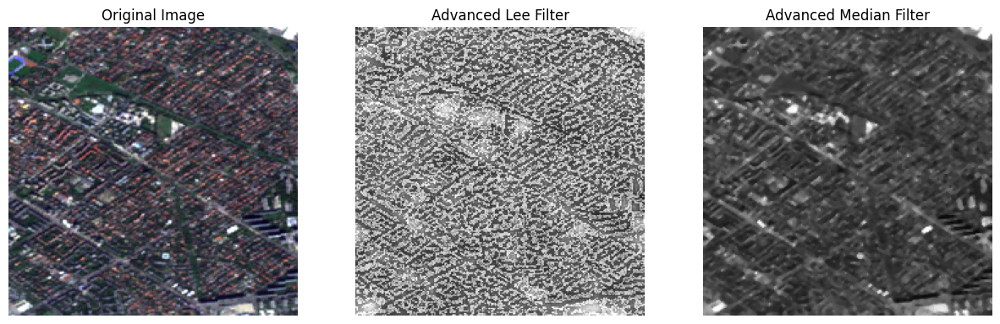

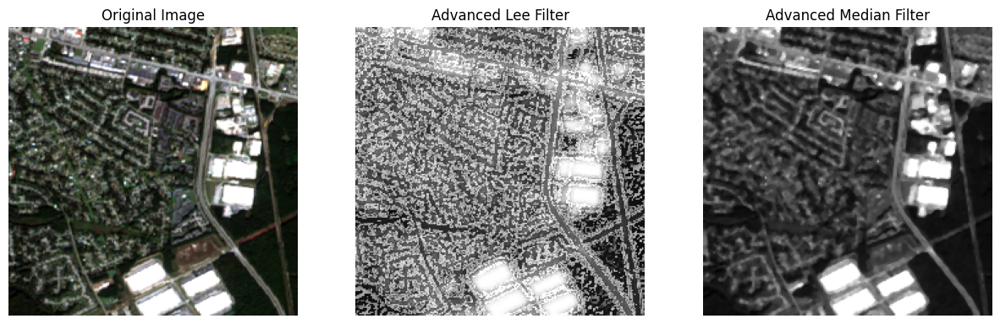

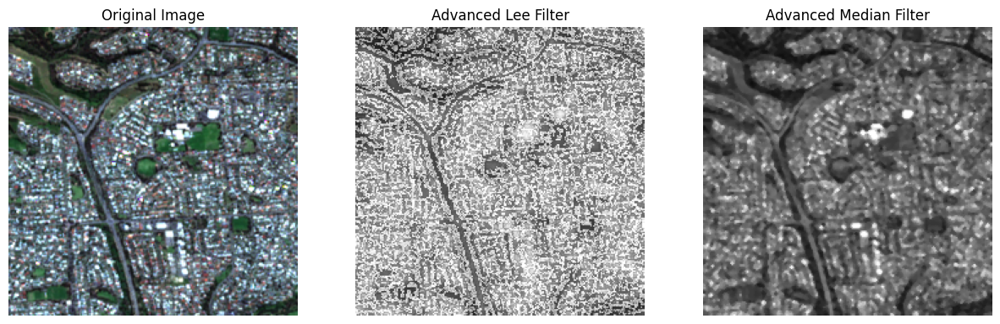

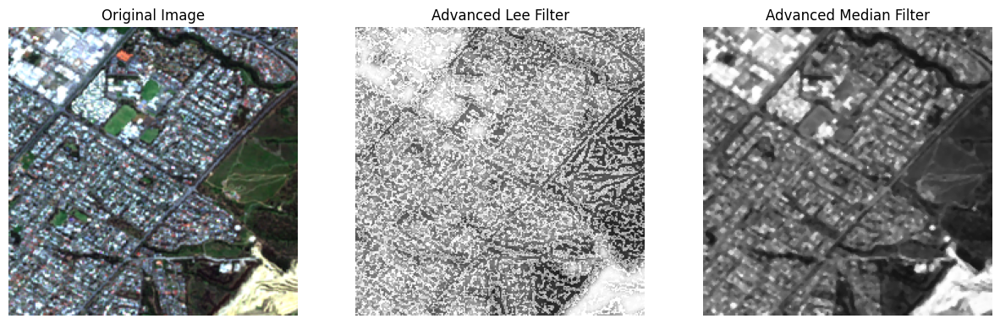

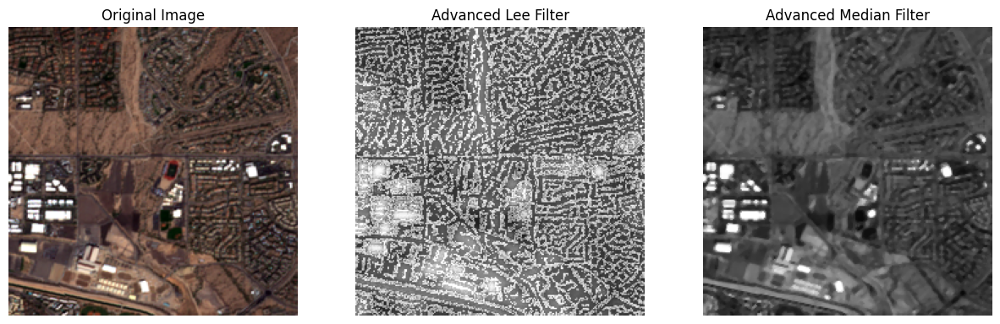

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

def advanced_lee_filter(img, size=7):
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2

    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)

    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    advanced_lee_filtered = np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8)
    
    return cv2.cvtColor(advanced_lee_filtered, cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    # Apply advanced median filter with adaptive neighborhood
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Initialize an empty image to store the filtered result
    filtered_img = np.zeros_like(gray_img)

    # Apply the median filter with an adaptive neighborhood
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            median_val = np.median(local_window)
            filtered_img[i, j] = median_val

    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Apply filters and display 5 images before and after filtering
sample_images = 5
processed_count = 0

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path):
        if processed_count >= sample_images:
            break

        # Load image
        img_path = os.path.join(label_path, img_name)
        img = Image.open(img_path)
        img = img.resize(IMG_SIZE)
        img = np.array(img)

        # Apply filters
        advanced_lee_filtered_img = advanced_lee_filter(img)
        advanced_median_filtered_img = advanced_median_filter(img)

        # Display original and filtered images
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[1].imshow(advanced_lee_filtered_img)
        ax[1].set_title("Advanced Lee Filter")
        ax[2].imshow(advanced_median_filtered_img)
        ax[2].set_title("Advanced Median Filter")
        for a in ax:
            a.axis('off')
        plt.show()

        processed_count += 1


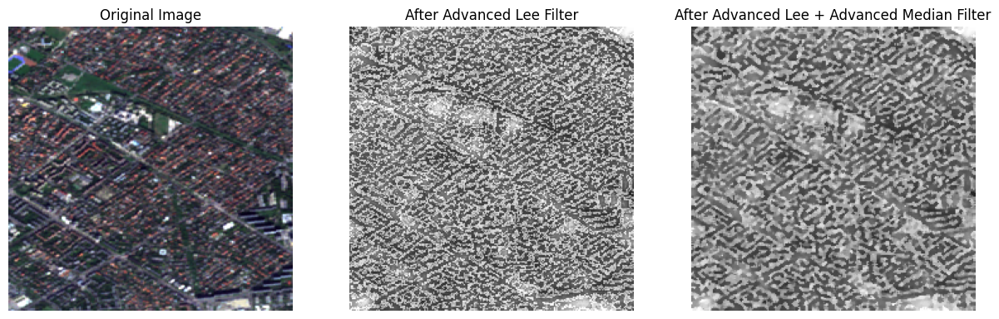

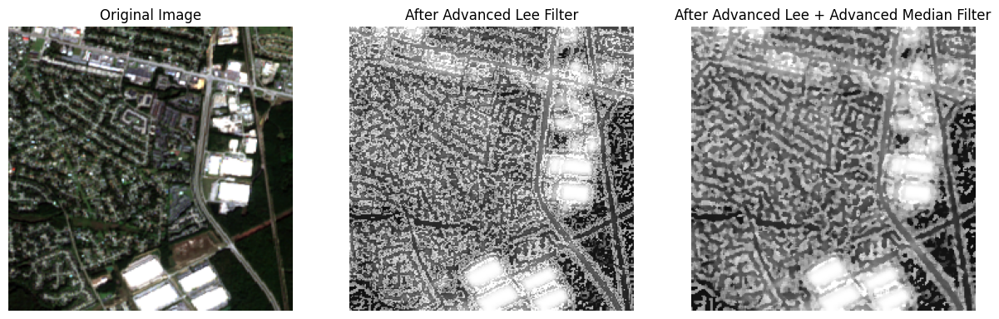

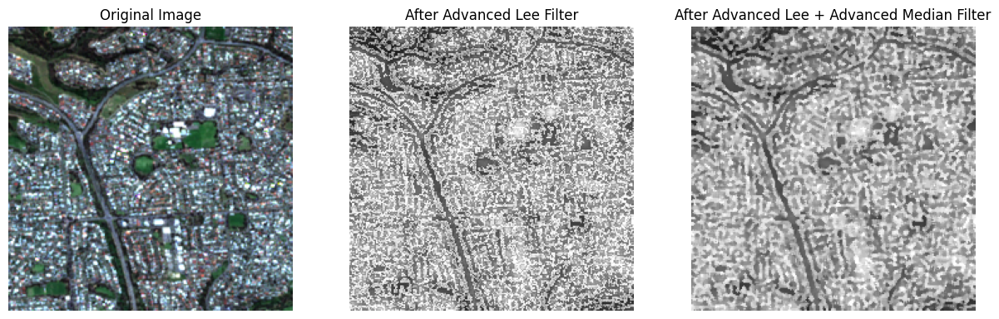

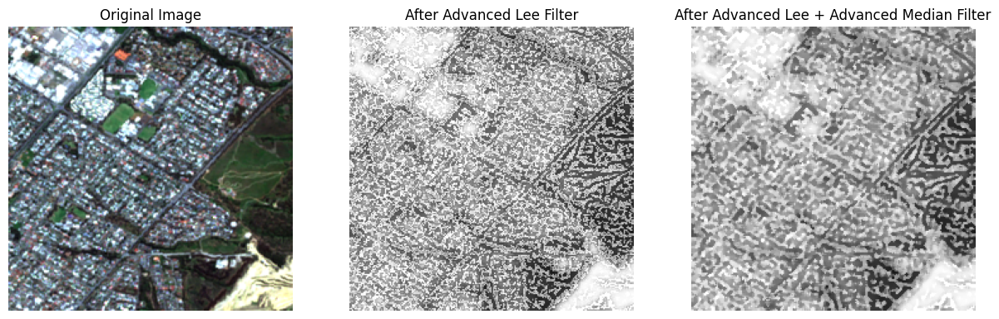

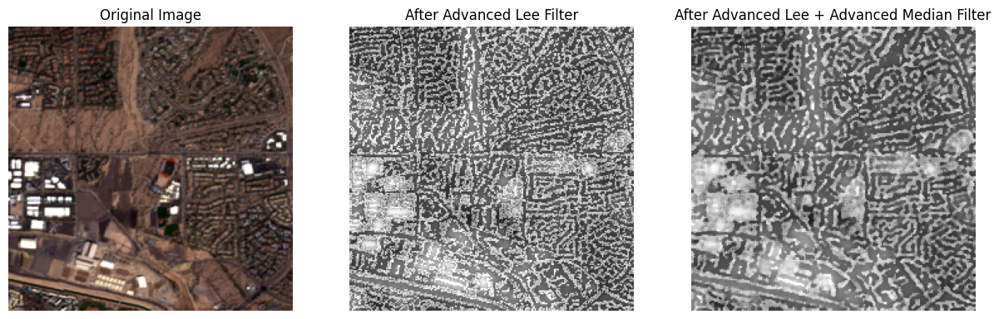

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

def advanced_lee_filter(img, size=7):
    # Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2

    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)

    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    advanced_lee_filtered = np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8)
    
    return cv2.cvtColor(advanced_lee_filtered, cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    # Apply advanced median filter with adaptive neighborhood
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Initialize an empty image to store the filtered result
    filtered_img = np.zeros_like(gray_img)

    # Apply the median filter with an adaptive neighborhood
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            median_val = np.median(local_window)
            filtered_img[i, j] = median_val

    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Apply both filters and display 5 images before and after filtering
sample_images = 5
processed_count = 0

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path):
        if processed_count >= sample_images:
            break

        # Load image
        img_path = os.path.join(label_path, img_name)
        img = Image.open(img_path)
        img = img.resize(IMG_SIZE)
        img = np.array(img)

        # Apply advanced Lee filter
        lee_filtered_img = advanced_lee_filter(img)
        
        # Apply advanced median filter on the result of advanced Lee filter
        combined_filtered_img = advanced_median_filter(lee_filtered_img)

        # Display original and filtered images
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[1].imshow(lee_filtered_img)
        ax[1].set_title("After Advanced Lee Filter")
        ax[2].imshow(combined_filtered_img)
        ax[2].set_title("After Advanced Lee + Advanced Median Filter")
        for a in ax:
            a.axis('off')
        plt.show()

        processed_count += 1


In [6]:
import cv2
import numpy as np
import os
import random
from tqdm import tqdm
from PIL import Image

# Define the paths for input and output directories
input_dataset_path = '/kaggle/working/SAR_Segment'
output_dataset_path = '/kaggle/working/Filtered_SAR_Segment'

# Ensure the output directory exists, creating subdirectories for each class
if not os.path.exists(output_dataset_path):
    os.makedirs(output_dataset_path)

for label in os.listdir(input_dataset_path):
    label_input_path = os.path.join(input_dataset_path, label)
    label_output_path = os.path.join(output_dataset_path, label)
    
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)

def advanced_lee_filter(img, size=7):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mean_img = cv2.blur(gray_img, (size, size))
    mean_square_img = cv2.blur(gray_img**2, (size, size))
    variance_img = mean_square_img - mean_img**2
    overall_variance = np.mean(variance_img)
    weights = np.clip(variance_img / (variance_img + overall_variance), 0, 1)
    advanced_lee_filtered = mean_img + weights * (gray_img - mean_img)
    return cv2.cvtColor(np.clip(advanced_lee_filtered, 0, 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)

def advanced_median_filter(img, size=3):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    filtered_img = np.zeros_like(gray_img)
    padded_img = np.pad(gray_img, size // 2, mode='reflect')
    for i in range(gray_img.shape[0]):
        for j in range(gray_img.shape[1]):
            local_window = padded_img[i:i+size, j:j+size]
            filtered_img[i, j] = np.median(local_window)
    return cv2.cvtColor(filtered_img, cv2.COLOR_GRAY2RGB)

# Process only 20% of images in each class with a progress bar
for label in os.listdir(input_dataset_path):
    label_input_path = os.path.join(input_dataset_path, label)
    label_output_path = os.path.join(output_dataset_path, label)
    
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)
    
    all_images = os.listdir(label_input_path)
    num_images_to_process = int(0.1 * len(all_images))
    sampled_images = random.sample(all_images, num_images_to_process)
    
    # Progress bar for each label
    print(f"Processing {label} images...")
    for img_name in tqdm(sampled_images, desc=f"Filtering {label}", unit="image"):
        img_path = os.path.join(label_input_path, img_name)
        img = Image.open(img_path).resize(IMG_SIZE)
        img = np.array(img)

        # Apply filters
        lee_filtered_img = advanced_lee_filter(img)
        combined_filtered_img = advanced_median_filter(lee_filtered_img)

        # Save filtered image
        output_img = Image.fromarray(combined_filtered_img)
        output_img.save(os.path.join(label_output_path, img_name))

print("Filtering completed for 10% of images in each class.")


Processing urban images...


Filtering urban: 100%|██████████| 400/400 [05:00<00:00,  1.33image/s]


Processing agri images...


Filtering agri: 100%|██████████| 400/400 [05:00<00:00,  1.33image/s]


Processing grassland images...


Filtering grassland: 100%|██████████| 400/400 [05:04<00:00,  1.31image/s]


Processing barrenland images...


Filtering barrenland: 100%|██████████| 400/400 [05:10<00:00,  1.29image/s]

Filtering completed for 10% of images in each class.


In [9]:
pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.4 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1
Note: you may need to restart the kernel to use updated packages.


In [11]:
!pip install git+https://github.com/scikit-fuzzy/scikit-fuzzy


  Cloning https://github.com/scikit-fuzzy/scikit-fuzzy to /tmp/pip-req-build-vt4stjhl
  Running command git clone --filter=blob:none --quiet https://github.com/scikit-fuzzy/scikit-fuzzy /tmp/pip-req-build-vt4stjhl
  Resolved https://github.com/scikit-fuzzy/scikit-fuzzy to commit be7e344f3ce65845e39922aa5fc1af7412d01944
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.5.0-py2.py3-none-any.whl size=920818 sha256=4e2d6e29d5496510b796702abd7aec7492d3435698b8b17140a95c0857ff49ca
  Stored in directory: /tmp/pip-ephem-wheel-cache-oa3el8br/wheels/82/d5/72/3e485c7a9b1a08d3b9f5d416c9990d987dc5138c319917a9db
Successfully built scikit-fuzzy


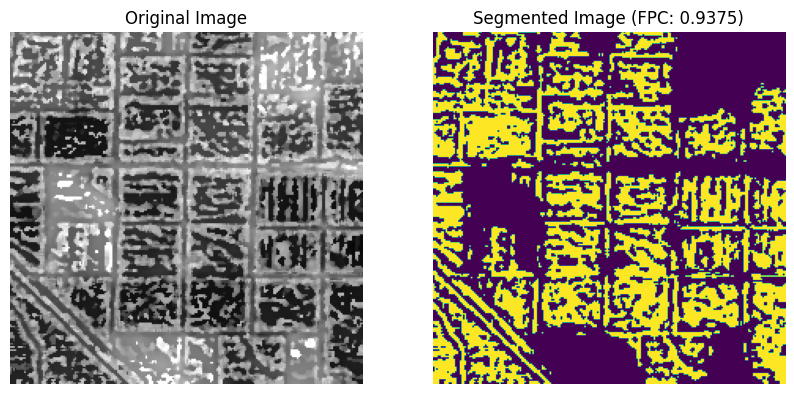

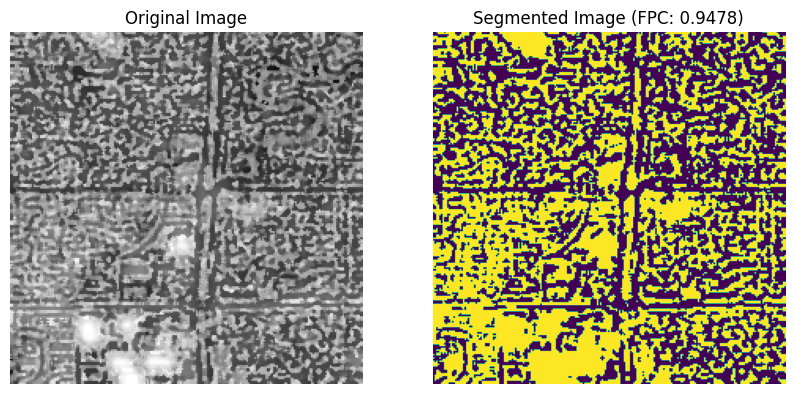

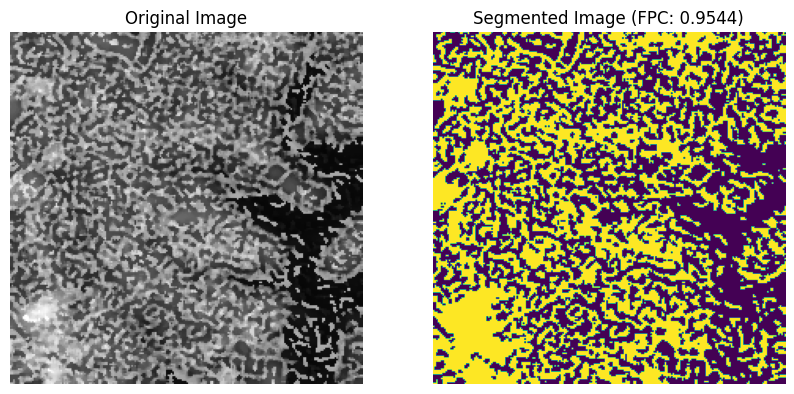

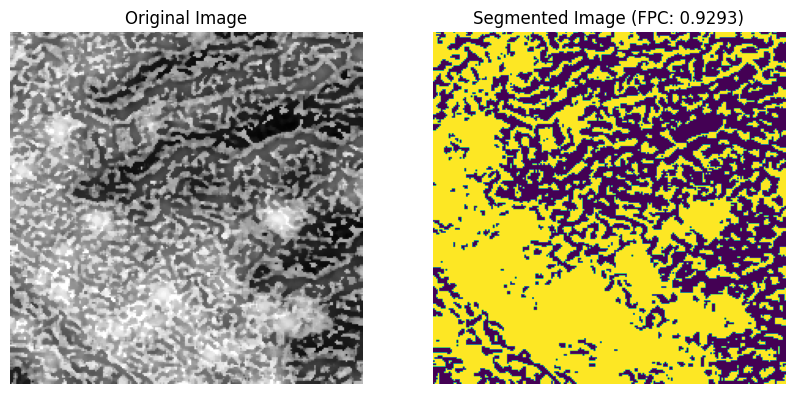

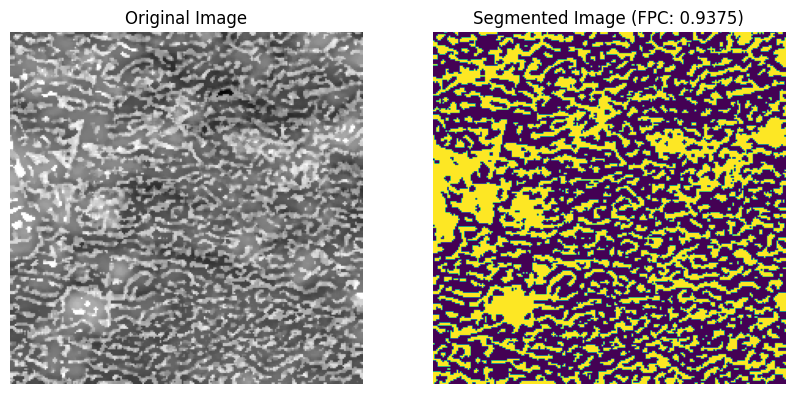

Fuzzy Partition Coefficients for the segmented images:
Image 1: FPC = 0.9375
Image 2: FPC = 0.9478
Image 3: FPC = 0.9544
Image 4: FPC = 0.9293
Image 5: FPC = 0.9375


In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import skfuzzy as fuzz
from skfuzzy.cluster import cmeans
from sklearn.model_selection import train_test_split

# Define paths
filtered_dataset_path = '/kaggle/working/Filtered_SAR_Segment'

# Function to load images and resize them for processing
def load_images(dataset_path, sample_percentage=0.1, img_size=(224, 224)):
    images = []
    labels = []
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            img = Image.open(img_path)
            img = img.resize(img_size)
            images.append(np.array(img))
            labels.append(label)
    # Sample 10% of the images
    _, sampled_images, _, _ = train_test_split(images, labels, test_size=sample_percentage, random_state=42)
    return sampled_images

# Load 10% of the dataset
sampled_images = load_images(filtered_dataset_path, sample_percentage=0.1)

# Function to apply Fuzzy C-means and calculate FPC
def fuzzy_cmeans_clustering(image, num_clusters=2):
    # Reshape image to a 2D array (pixels x channels)
    img_2d = image.reshape(-1, 3).T  # Transpose for skfuzzy

    # Apply Fuzzy C-means
    cntr, u, _, _, _, _, fpc = cmeans(
        img_2d, c=num_clusters, m=1.5, error=0.005, maxiter=100, init=None
    )
    
    # Get the hard clustering result by finding the max probability for each pixel
    cluster_membership = np.argmax(u, axis=0)
    segmented_image = cluster_membership.reshape(image.shape[:2])

    return segmented_image, fpc

# Apply Fuzzy C-means on the first 5 images and display results
fpc_scores = []
for i, image in enumerate(sampled_images[:5]):
    segmented_image, fpc = fuzzy_cmeans_clustering(image)
    fpc_scores.append(fpc)
    
    # Display original and segmented image
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")
    
    ax[1].imshow(segmented_image, cmap="viridis")
    ax[1].set_title(f"Segmented Image (FPC: {fpc:.4f})")
    ax[1].axis("off")
    plt.show()

# Print the FPC scores for the processed images
print("Fuzzy Partition Coefficients for the segmented images:")
for i, fpc in enumerate(fpc_scores, 1):
    print(f"Image {i}: FPC = {fpc:.4f}")


In [13]:
import os
import numpy as np
from PIL import Image
import skfuzzy as fuzz
from skfuzzy.cluster import cmeans
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define paths for input (filtered images) and output (segmented images)
filtered_dataset_path = '/kaggle/working/Filtered_SAR_Segment'
segmented_dataset_path = '/kaggle/working/Segmented_SAR_Segment'

# Ensure the output directory exists, creating subdirectories for each class
if not os.path.exists(segmented_dataset_path):
    os.makedirs(segmented_dataset_path)

for label in os.listdir(filtered_dataset_path):
    label_output_path = os.path.join(segmented_dataset_path, label)
    if not os.path.exists(label_output_path):
        os.makedirs(label_output_path)

# Function to load images and resize them for processing
def load_images(dataset_path, sample_percentage=0.5, img_size=(224, 224)):
    images = []
    labels = []
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            img = Image.open(img_path)
            img = img.resize(img_size)
            images.append(np.array(img))
            labels.append((label, img_name))
    # Sample 50% of the images
    _, sampled_images, _, sampled_labels = train_test_split(images, labels, test_size=sample_percentage, random_state=42)
    return sampled_images, sampled_labels

# Load 50% of the dataset
sampled_images, sampled_labels = load_images(filtered_dataset_path, sample_percentage=0.5)

# Function to apply Fuzzy C-means and save segmented images
def fuzzy_cmeans_clustering(image, num_clusters=2):
    # Reshape image to a 2D array (pixels x channels)
    img_2d = image.reshape(-1, 3).T  # Transpose for skfuzzy

    # Apply Fuzzy C-means
    cntr, u, _, _, _, _, _ = cmeans(
        img_2d, c=num_clusters, m=1.5, error=0.005, maxiter=1000, init=None
    )
    
    # Get the hard clustering result by finding the max probability for each pixel
    cluster_membership = np.argmax(u, axis=0)
    segmented_image = cluster_membership.reshape(image.shape[:2])

    return segmented_image

# Apply Fuzzy C-means on the sampled dataset and save the segmented images
for (image, (label, img_name)) in zip(sampled_images, sampled_labels):
    # Apply Fuzzy C-means
    segmented_image = fuzzy_cmeans_clustering(image)
    
    # Convert the segmented image to RGB format for saving
    segmented_rgb_image = Image.fromarray((segmented_image * (255 // segmented_image.max())).astype(np.uint8))

    # Save the segmented image in the corresponding class folder in the segmented dataset path
    output_label_path = os.path.join(segmented_dataset_path, label)
    segmented_rgb_image.save(os.path.join(output_label_path, img_name))

print("50% of the dataset has been segmented and saved in 'Segmented_SAR_Segment'.")


50% of the dataset has been segmented and saved in 'Segmented_SAR_Segment'.


In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import Progbar
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split

# Define paths for input dataset
segmented_dataset_path = '/kaggle/working/Segmented_SAR_Segment'

# Image size and batch size
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 10

# Define the U-Net model
def unet_model(input_size=(224, 224, 3)):
    inputs = Input(input_size)
    
    # Encoder
    c1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, 3, activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, 3, activation='relu', padding='same')(p1)
    c2 = Conv2D(128, 3, activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, 3, activation='relu', padding='same')(p2)
    c3 = Conv2D(256, 3, activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    # Bottleneck
    b1 = Conv2D(512, 3, activation='relu', padding='same')(p3)
    b1 = Conv2D(512, 3, activation='relu', padding='same')(b1)
    
    # Decoder
    u2 = UpSampling2D((2, 2))(b1)
    u2 = Concatenate()([u2, c3])
    c4 = Conv2D(256, 3, activation='relu', padding='same')(u2)
    c4 = Conv2D(256, 3, activation='relu', padding='same')(c4)
    
    u3 = UpSampling2D((2, 2))(c4)
    u3 = Concatenate()([u3, c2])
    c5 = Conv2D(128, 3, activation='relu', padding='same')(u3)
    c5 = Conv2D(128, 3, activation='relu', padding='same')(c5)
    
    u4 = UpSampling2D((2, 2))(c5)
    u4 = Concatenate()([u4, c1])
    c6 = Conv2D(64, 3, activation='relu', padding='same')(u4)
    c6 = Conv2D(64, 3, activation='relu', padding='same')(c6)
    
    outputs = Conv2D(1, 1, activation='sigmoid')(c6)
    
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    return model

# Load images and masks from segmented dataset
def load_images_and_masks(dataset_path, img_size=(224, 224)):
    images = []
    masks = []
    
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            
            # Load and resize image
            img = Image.open(img_path).resize(img_size)
            img = np.array(img) / 255.0  # Normalize the image
            
            # Generate a mask based on class label
            mask = np.ones(img_size) if label == "urban" else np.zeros(img_size)
            
            images.append(img)
            masks.append(mask)
    
    images = np.array(images).astype(np.float32)
    masks = np.expand_dims(np.array(masks).astype(np.float32), axis=-1)
    
    return images, masks

# Prepare dataset
images, masks = load_images_and_masks(segmented_dataset_path)
x_train, x_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=42)

# Initialize U-Net model
model = unet_model(input_size=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Train the model with a progress bar
for epoch in range(EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    progbar = Progbar(len(x_train) // BATCH_SIZE)
    
    for i in range(0, len(x_train), BATCH_SIZE):
        x_batch = x_train[i:i+BATCH_SIZE]
        y_batch = y_train[i:i+BATCH_SIZE]
        
        # Train on batch
        model.train_on_batch(x_batch, y_batch)
        progbar.add(1)
    
    # Evaluate on validation data
    val_loss, val_accuracy = model.evaluate(x_val, y_val, verbose=0)
    print(f"\nValidation loss: {val_loss}, Validation accuracy: {val_accuracy}")

print("Training complete.")


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/Segmented_SAR_Segment'